# Sequence to Sequence Models for Timeseries Regression


In this notebook we are going to tackle a harder problem: 
- predicting the future on a timeseries
- using an LSTM
- with rough uncertainty (uncalibrated)
- outputing sequence of predictions

<img src="../reports/figures/Seq2Seq for regression.png" />


https://medium.com/@boitemailjeanmid/smart-meters-in-london-part1-description-and-first-insights-jean-michel-d-db97af2de71b


In [1]:
# OPTIONAL: Load the "autoreload" extension so that code can change. But blacklist large modules
%load_ext autoreload
%autoreload 2
%aimport -pandas
%aimport -torch
%aimport -numpy
%aimport -matplotlib
%aimport -dask
%aimport -tqdm
%matplotlib inline

In [2]:
# Imports
import torch
from torch import nn, optim
from torch.nn import functional as F
from torch.autograd import Variable
import torch
import torch.utils.data

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (12.0, 3.0)
plt.style.use('ggplot')

from pathlib import Path
from tqdm.auto import tqdm

import pytorch_lightning as pl

In [3]:
import warnings
warnings.simplefilter('once')

In [4]:
from seq2seq_time.data.dataset import Seq2SeqDataSet, Seq2SeqDataSets
from seq2seq_time.predict import predict, predict_multi

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [5]:
import logging, sys
# logging.basicConfig(stream=sys.stdout, level=logging.INFO)

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Parameters

In [6]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f'using {device}')

columns_target=['energy(kWh/hh)']
window_past = 48*2
window_future = 48*2
batch_size = 128
num_workers = 5
freq = '30T'
max_rows = 5e5

using cuda


## Load data

In [7]:

def get_smartmeter_df(indir=Path('../data/raw/smart-meters-in-london'), max_files=8):
    """
    Data loading and cleanding is always messy, so understand this code is optional.
    """
    
    # Load csv files
    csv_files = sorted((indir/'halfhourly_dataset').glob('*.csv'))[:max_files]
    
    dfs = []
    for f in csv_files:
        df = (pd.read_csv(f, parse_dates=[1], na_values=['Null'])
              .groupby('tstp')
              .sum()
              .sort_index()
             )
        df['block'] = f.stem

        # Drop nan and 0's
        df = df[df['energy(kWh/hh)']!=0]
        df = df.dropna()
        
        # Add time features 
        time = df.index.to_series()
        df["month"] = time.dt.month
        df['day'] = time.dt.day
        df['week'] = time.dt.week
        df['hour'] = time.dt.hour
        df['minute'] = time.dt.minute
        df['dayofweek'] = time.dt.dayofweek

        # Load weather data
        df_weather = pd.read_csv(indir/'weather_hourly_darksky.csv', parse_dates=[3])
        use_cols = ['visibility', 'windBearing', 'temperature', 'time', 'dewPoint',
               'pressure', 'apparentTemperature', 'windSpeed', 
               'humidity']
        df_weather = df_weather[use_cols].set_index('time')
        
        # Resample to match energy data   
        # Use first, since we have bearing, and you can't take mean
        df_weather = df_weather.resample(freq).first().ffill()  

        # Join weather and energy data
        df = pd.merge(df, df_weather, how='inner', left_index=True, right_index=True, sort=True)

        # Holidays
        df_hols = pd.read_csv(indir/'uk_bank_holidays.csv', parse_dates=[0])
        holidays = set(df_hols['Bank holidays'].dt.round('D'))  
        def is_holiday(dt):
            return dt in holidays
        days = df.index.floor('D')
        holiday_mapping = days.unique().to_series().apply(is_holiday).astype(int).to_dict()
        df['holiday'] = days.to_series().map(holiday_mapping).values

        # sort
        df.index.name = 'Date'
        df = df.loc['2012-09':] # Weird value before this
    
        dfs.append(df)
    
    return pd.concat(dfs)

Our dataset is the london smartmeter data. But at half hour intervals

In [8]:
df = get_smartmeter_df(max_files=12)

# # Just get the first one for now
# dfs = list(dfs)

# # df = df.resample(freq).first().dropna() # Where empty we will backfill, this will respect causality, and mostly maintain the mean

df = df.tail(int(max_rows)).copy() # Just use last X rows
# df = pd.concat(dfs[:6], 0)
# # df = dfs[0]
print(df.block.value_counts())
df

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarnin

block_0      26161
block_107    26161
block_106    26161
block_1      26161
block_105    26161
block_102    26161
block_108    26161
block_100    26161
block_10     26161
block_101    26161
block_104    26161
block_103    26161
Name: block, dtype: int64


,energy(kWh/hh),block,month,day,week,hour,minute,dayofweek,visibility,windBearing,temperature,dewPoint,pressure,apparentTemperature,windSpeed,humidity,holiday
Date,,,,,,,,,,,,,,,,,
2012-09-01 00:00:00,5.013,block_0,9,1,35,0,0,5,13.36,302.0,14.08,9.74,1028.27,14.08,1.89,0.75,0
2012-09-01 00:30:00,5.157,block_0,9,1,35,0,30,5,13.36,302.0,14.08,9.74,1028.27,14.08,1.89,0.75,0
2012-09-01 01:00:00,6.360,block_0,9,1,35,1,0,5,13.50,298.0,13.93,9.81,1027.96,13.93,1.59,0.76,0
2012-09-01 01:30:00,5.511,block_0,9,1,35,1,30,5,13.50,298.0,13.93,9.81,1027.96,13.93,1.59,0.76,0
2012-09-01 02:00:00,4.922,block_0,9,1,35,2,0,5,13.21,274.0,13.52,9.94,1028.04,13.52,0.82,0.79,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-02-27 22:00:00,9.819,block_108,2,27,9,22,0,3,14.00,216.0,4.10,1.64,1005.67,1.41,3.02,0.84,0
2014-02-27 22:30:00,8.792,block_108,2,27,9,22,30,3,14.00,216.0,4.10,1.64,1005.67,1.41,3.02,0.84,0
2014-02-27 23:00:00,8.087,block_108,2,27,9,23,0,3,14.03,200.0,3.93,1.61,1004.62,1.42,2.75,0.85,0


### Plot/explore

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/holoviews/operation/datashader.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Callable


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
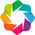

In [9]:
import holoviews as hv
from holoviews import opts

from holoviews.plotting.links import RangeToolLink

import datashader as ds

from holoviews.operation.datashader import datashade, shade, dynspread, rasterize
from holoviews.operation import decimate

hv.extension('bokeh')


# def house_curve(Name=None):
#     if isinstance(Name, int):
#         name = df.block.unique()[Name]
#     d = df[df.block == Name]
#     d_curve = hv.Curve(d, 'Date', 'energy(kWh/hh)', label=Name).opts(framewise=True)
#     return d_curve


# dmap = hv.DynamicMap(house_curve, kdims=['Name'])
# dmap = dmap.redim.values(Name=list(df.block.unique()))
# dynspread(datashade(dmap).opts(width=800,
#                      height=300,
#                      tools=['xwheel_zoom', 'pan'],
#                      active_tools=['xwheel_zoom', 'pan'],
#                      default_tools=['reset', 'save', 'hover']
#                     ))

### Profiling

In [10]:
# from pandas_profiling import ProfileReport
# profile = ProfileReport(df, title="Pandas Profiling Report", minimal=True)
# profile

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Norm

In [11]:
df.describe()

,energy(kWh/hh),month,day,week,hour,minute,dayofweek,visibility,windBearing,temperature,dewPoint,pressure,apparentTemperature,windSpeed,humidity,holiday
count,313932.000000,313932.000000,313932.000000,313932.000000,313932.00000,313932.000000,313932.000000,313932.000000,313932.000000,313932.000000,313932.000000,313932.000000,313932.000000,313932.000000,313932.000000,313932.000000
mean,10.304546,6.878713,15.659187,27.962578,11.49956,14.999427,2.998203,11.203636,194.973128,10.196924,6.316654,1012.613350,8.845714,3.968334,0.784663,0.022018
std,6.425374,3.797205,8.768608,16.528737,6.92243,15.000024,2.001349,3.087941,91.343087,5.891891,5.118656,11.278742,7.116397,2.073511,0.140025,0.146741
min,1.634000,1.000000,1.000000,1.000000,0.00000,0.000000,0.000000,0.270000,0.000000,-3.860000,-8.920000,975.740000,-8.880000,0.040000,0.230000,0.000000
25%,6.121000,3.000000,8.000000,11.000000,5.00000,0.000000,1.000000,10.120000,119.000000,6.050000,2.560000,1005.900000,3.360000,2.450000,0.710000,0.000000
50%,8.502000,8.000000,16.000000,31.000000,11.00000,0.000000,3.000000,12.230000,216.000000,9.580000,6.460000,1013.600000,7.990000,3.720000,0.810000,0.000000
75%,12.126000,10.000000,23.000000,43.000000,17.00000,30.000000,5.000000,13.080000,255.000000,14.070000,10.060000,1020.550000,14.070000,5.160000,0.890000,0.000000
max,53.965000,12.000000,31.000000,52.000000,23.00000,30.000000,6.000000,16.090000,359.000000,32.400000,18.950000,1040.130000,32.420000,14.800000,1.000000,1.000000


In [12]:
import sklearn
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn_pandas import DataFrameMapper

columns_input_numeric = list(df.drop(columns=columns_target)._get_numeric_data().columns)
columns_categorical = list(set(df.columns)-set(columns_input_numeric)-set(columns_target))

output_scalers = [([n], StandardScaler()) for n in columns_target]
transformers=output_scalers + \
[([n], StandardScaler()) for n in columns_input_numeric] + \
[([n], OrdinalEncoder()) for n in columns_categorical]
scaler = DataFrameMapper(transformers, df_out=True)
df_norm = scaler.fit_transform(df)
df_norm

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,energy(kWh/hh),month,day,week,hour,minute,dayofweek,visibility,windBearing,temperature,dewPoint,pressure,apparentTemperature,windSpeed,humidity,holiday,block
Date,,,,,,,,,,,,,,,,,
2012-09-01 00:00:00,-0.823540,0.558645,-1.671783,0.425770,-1.661205,-0.999962,1.000225,0.698319,1.171704,0.659055,0.668799,1.388158,0.735526,-1.002328,-0.247549,-0.150044,0.0
2012-09-01 00:30:00,-0.801129,0.558645,-1.671783,0.425770,-1.661205,1.000038,1.000225,0.698319,1.171704,0.659055,0.668799,1.388158,0.735526,-1.002328,-0.247549,-0.150044,0.0
2012-09-01 01:00:00,-0.613902,0.558645,-1.671783,0.425770,-1.516747,-0.999962,1.000225,0.743657,1.127913,0.633597,0.682474,1.360673,0.714448,-1.147010,-0.176133,-0.150044,0.0
2012-09-01 01:30:00,-0.746035,0.558645,-1.671783,0.425770,-1.516747,1.000038,1.000225,0.743657,1.127913,0.633597,0.682474,1.360673,0.714448,-1.147010,-0.176133,-0.150044,0.0
2012-09-01 02:00:00,-0.837703,0.558645,-1.671783,0.425770,-1.372289,-0.999962,1.000225,0.649743,0.865167,0.564009,0.707872,1.367766,0.656834,-1.518362,0.038114,-0.150044,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-02-27 22:00:00,-0.075567,-1.284819,1.293344,-1.147251,1.516874,-0.999962,0.000898,0.905577,0.230197,-1.034801,-0.913650,-0.615615,-1.044872,-0.457357,0.395193,-0.150044,11.0
2014-02-27 22:30:00,-0.235402,-1.284819,1.293344,-1.147251,1.516874,1.000038,0.000898,0.905577,0.230197,-1.034801,-0.913650,-0.615615,-1.044872,-0.457357,0.395193,-0.150044,11.0
2014-02-27 23:00:00,-0.345124,-1.284819,1.293344,-1.147251,1.661332,-0.999962,0.000898,0.915292,0.055033,-1.063654,-0.919511,-0.708710,-1.043467,-0.587572,0.466609,-0.150044,11.0


In [13]:
output_scaler = next(filter(lambda r:r[0][0] in columns_target, scaler.features))[-1]
output_scaler

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


StandardScaler()

### Split

In [14]:
# split data, with the test in the future

d0 =df_norm.index.min()
d1 = df_norm.index.max()
split_time = d0+(d1-d0)*0.8
split_time = split_time.round('1D')
print(split_time)
df_train = df_norm.groupby('block').apply(lambda d:d.loc[:split_time]).reset_index(level=0, drop=True)
df_test = df_norm.groupby('block').apply(lambda d:d.loc[split_time:]).reset_index(level=0, drop=True)
# df_test

2013-11-11 00:00:00


In [15]:
# # Show split
# df_train['energy(kWh/hh)'].plot(label='train')
# df_test['energy(kWh/hh)'].plot(label='test')
# plt.ylabel('energy(kWh/hh)')
# plt.legend()

In [16]:
# # Show split
scatter = dynspread(datashade(hv.Curve(df_train, kdims=['Date'], vdims=['energy(kWh/hh)', 'block']).groupby('block'), cmap='blue'))
scatter *= dynspread(datashade(hv.Curve(df_test, kdims=['Date'], vdims=['energy(kWh/hh)', 'block']).groupby('block'), cmap='red'))
scatter = scatter.opts(plot=dict(width=800))
scatter

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/bokeh/core/property/bases.py:241: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  return new == old


:DynamicMap   [block]
   :Overlay
      .RGB.I  :RGB   [Date,energy(kWh/hh)]   (R,G,B,A)
      .RGB.II :RGB   [Date,energy(kWh/hh)]   (R,G,B,A)

### Dataset

In [17]:

# ### Dataset
# These are the columns that we wont know in the future
# We need to blank them out in x_future
columns_blank=['visibility',
       'windBearing', 'temperature', 'dewPoint', 'pressure',
       'apparentTemperature', 'windSpeed', 'humidity']
df_trains = [d.resample(freq).first().ffill().dropna() for _,d in df_train.groupby('block')]
df_tests = [d.resample(freq).first().ffill().dropna() for _,d in df_test.groupby('block')]
ds_train = Seq2SeqDataSets(df_trains,
                          window_past=window_past,
                          window_future=window_future,
                          columns_blank=columns_blank)
ds_test = Seq2SeqDataSets(df_tests,
                         window_past=window_past,
                         window_future=window_future,
                         columns_blank=columns_blank)
print(ds_train)
print(ds_test)

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Seq2SeqDataSets([<Seq2SeqDataSet(shape=(20929, 17), times=2012-09-01 00:00:00 to 2012-09-01 00:30:00 at 30T)>, <Seq2SeqDataSet(shape=(20929, 17), times=2012-09-01 00:00:00 to 2012-09-01 00:30:00 at 30T)>, <Seq2SeqDataSet(shape=(20929, 17), times=2012-09-01 00:00:00 to 2012-09-01 00:30:00 at 30T)>, <Seq2SeqDataSet(shape=(20929, 17), times=2012-09-01 00:00:00 to 2012-09-01 00:30:00 at 30T)>, <Seq2SeqDataSet(shape=(20929, 17), times=2012-09-01 00:00:00 to 2012-09-01 00:30:00 at 30T)>, <Seq2SeqDataSet(shape=(20929, 17), times=2012-09-01 00:00:00 to 2012-09-01 00:30:00 at 30T)>, <Seq2SeqDataSet(shape=(20929, 17), times=2012-09-01 00:00:00 to 2012-09-01 00:30:00 at 30T)>, <Seq2SeqDataSet(shape=(20929, 17), times=2012-09-01 00:00:00 to 2012-09-01 00:30:00 at 30T)>, <Seq2SeqDataSet(shape=(20929, 17), times=2012-09-01 00:00:00 to 2012-09-01 00:30:00 at 30T)>, <Seq2SeqDataSet(shape=(20929, 17), times=2012-09-01 00:00:00 to 2012-09-01 00:30:00 at 30T)>, <Seq2SeqDataSet(shape=(20929, 17), times=2

In [18]:
# we can treat it like an array
ds_train[0]
len(ds_train)
ds_train[-1]

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[array([[ 1.0853493 , -0.9875229 ,  1.0307775 , ...,  0.        ,
         -2.        ,  1.        ],
        [ 1.0853493 , -0.9875229 ,  1.0307775 , ...,  0.        ,
         -1.9791666 ,  1.        ],
        [ 1.0853493 , -0.9875229 ,  1.0307775 , ...,  0.        ,
         -1.9583334 ,  1.        ],
        ...,
        [ 1.0853493 , -0.87347955,  1.0307775 , ...,  0.        ,
         -0.0625    ,  1.        ],
        [ 1.0853493 , -0.75943613,  1.0307775 , ...,  0.        ,
         -0.04166667,  1.        ],
        [ 1.0853493 , -0.75943613,  1.0307775 , ...,  0.        ,
         -0.02083333,  1.        ]], dtype=float32),
 array([[ 0.21577835],
        [ 0.15010113],
        [ 0.13095824],
        [ 0.02481639],
        [ 0.02030303],
        [-0.0716762 ],
        [ 0.15803841],
        [ 0.02917414],
        [-0.0674741 ],
        [ 0.20052628],
        [ 0.19009887],
        [ 0.6498394 ],
        [ 1.2491828 ],
        [ 1.628461  ],
        [ 1.5388163 ],
        [ 1.9

,month,day,week,hour,minute,dayofweek,visibility,windBearing,temperature,dewPoint,pressure,apparentTemperature,windSpeed,humidity,holiday,block,tsp_days,is_past
Date,,,,,,,,,,,,,,,,,,
2013-11-08 17:00:00,1.085349,-0.87348,1.030777,0.794583,-0.999962,0.500561,-0.205197,0.700950,-0.350809,0.160852,-0.928594,-0.347889,-0.539344,1.037935,-0.150044,0.0,-0.104167,1.0
2013-11-08 17:30:00,1.085349,-0.87348,1.030777,0.794583,1.000038,0.500561,-0.205197,0.700950,-0.350809,0.160852,-0.928594,-0.347889,-0.539344,1.037935,-0.150044,0.0,-0.083333,1.0
2013-11-08 18:00:00,1.085349,-0.87348,1.030777,0.939042,-0.999962,0.500561,0.176935,0.919905,-0.349112,0.139362,-0.896675,-0.442038,0.034563,1.037935,-0.150044,0.0,-0.062500,1.0
2013-11-08 18:30:00,1.085349,-0.87348,1.030777,0.939042,1.000038,0.500561,0.176935,0.919905,-0.349112,0.139362,-0.896675,-0.442038,0.034563,1.037935,-0.150044,0.0,-0.041667,1.0
2013-11-08 19:00:00,1.085349,-0.87348,1.030777,1.083500,-0.999962,0.500561,0.118644,0.952749,-0.391543,-0.048187,-0.821312,-0.517919,0.270877,0.680856,-0.150044,0.0,-0.020833,1.0


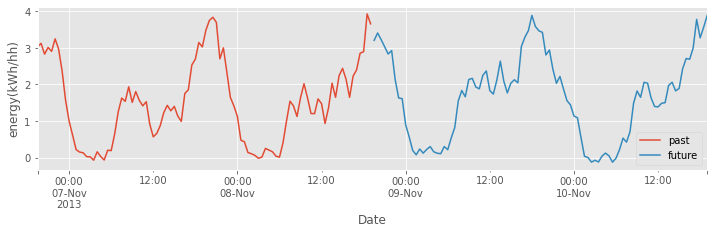

In [19]:
# We can get rows
x_past, y_past, x_future, y_future = ds_train.get_rows(10)

# Plot one instance, this is what the model sees
y_past['energy(kWh/hh)'].plot(label='past')
y_future['energy(kWh/hh)'].plot(ax=plt.gca(), label='future')
plt.legend()
plt.ylabel('energy(kWh/hh)')

# Notice we've added on two new columns tsp (time since present) and is_past
x_past.tail()

In [20]:
# Notice we've hidden some future columns to prevent cheating
x_future.tail()

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,month,day,week,hour,minute,dayofweek,visibility,windBearing,temperature,dewPoint,pressure,apparentTemperature,windSpeed,humidity,holiday,block,tsp_days,is_past
Date,,,,,,,,,,,,,,,,,,
2013-11-10 17:00:00,1.085349,-0.645393,1.030777,0.794583,-0.999962,1.499889,-0.328257,0.36157,0.77956,1.225586,-1.236252,0.835296,2.180685,0.609441,-0.150044,0.0,1.895833,0.0
2013-11-10 17:30:00,1.085349,-0.645393,1.030777,0.794583,1.000038,1.499889,-0.328257,0.36157,0.77956,1.225586,-1.236252,0.835296,2.180685,0.609441,-0.150044,0.0,1.916667,0.0
2013-11-10 18:00:00,1.085349,-0.645393,1.030777,0.939042,-0.999962,1.499889,-0.328257,0.36157,0.77956,1.225586,-1.236252,0.835296,2.180685,0.609441,-0.150044,0.0,1.937500,0.0
2013-11-10 18:30:00,1.085349,-0.645393,1.030777,0.939042,1.000038,1.499889,-0.328257,0.36157,0.77956,1.225586,-1.236252,0.835296,2.180685,0.609441,-0.150044,0.0,1.958333,0.0
2013-11-10 19:00:00,1.085349,-0.645393,1.030777,1.083500,-0.999962,1.499889,-0.328257,0.36157,0.77956,1.225586,-1.236252,0.835296,2.180685,0.609441,-0.150044,0.0,1.979167,0.0


## Plot helpers

In [21]:
def plot_prediction(ds_preds, i):
    """Plot a prediction into the future, at a single point in time."""
    d = ds_preds.isel(t_source=i)

    # Get arrays
    xf = d.t_target
    yp = d.y_pred
    s = d.y_pred_std
    yt = d.y_true
    now = d.t_source.squeeze()
    
    
    plt.figure(figsize=(12, 4))
    
    plt.scatter(xf, yt, label='true', c='k', s=6)
    ylim = plt.ylim()

    # plot prediction
    plt.fill_between(xf, yp-2*s, yp+2*s, alpha=0.25,
            facecolor="b",
            interpolate=True,
            label="2 std",)
    plt.plot(xf, yp, label='pred', c='b')

    # plot true
    plt.scatter(
        d.t_past,
        d.y_past,
        c='k',
        s=6
    )
    
    # plot a red line for now
    plt.vlines(x=now, ymin=0, ymax=1, label='now', color='r')
    plt.ylim(*ylim)

    now=pd.Timestamp(now.values)
    plt.title(f'Prediction NLL={d.nll.mean().item():2.2g}')
    plt.xlabel(f'{now.date()}')
    plt.ylabel('energy(kWh/hh)')
    plt.legend()
    plt.xticks(rotation=45)
    plt.show()
    
def plot_performance(ds_preds, full=False):
    """Multiple plots using xr_preds"""
    plot_prediction(ds_preds, 24)

    ds_preds.mean('t_source').plot.scatter('t_ahead_hours', 'nll') # Mean over all predictions
    n = len(ds_preds.t_source)
    plt.ylabel('Negative Log Likelihood (lower is better)')
    plt.xlabel('Hours ahead')
    plt.title(f'NLL vs time ahead (no. samples={n})')
    plt.show()

    # Make a plot of the NLL over time. Does this solution get worse with time?
    if full:
        d = ds_preds.mean('t_ahead').groupby('t_source').mean().plot.scatter('t_source', 'nll')
        plt.xticks(rotation=45)
        plt.title('NLL over source time (lower is better)')
        plt.show()

    # A scatter plot is easy with xarray
    if full:
        plt.figure(figsize=(5, 5))
        ds_preds.plot.scatter('y_true', 'y_pred', s=.01)
        plt.show()

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [22]:
def plot_hist(trainer):
    try:
        df_hist = pd.read_csv(trainer.logger.experiment.metrics_file_path)
        df_hist['epoch'] = df_hist['epoch'].ffill()
        df_histe = df_hist.set_index('epoch').groupby('epoch').mean()
        if len(df_histe)>1:
            df_histe[['loss/train', 'loss/val']].plot(title='history')
        return df_histe
    except Exception:
        pass

## Lightning

In [23]:
import pytorch_lightning as pl

class PL_MODEL(pl.LightningModule):
    def __init__(self, model, lr=3e-4, patience=2, weight_decay=0):
        super().__init__()
        self._model = model
        self.lr = lr
        self.patience = patience
        self.weight_decay = weight_decay

    def forward(self, x_past, y_past, x_future, y_future=None):
        """Eval/Predict"""
        y_dist, extra = self._model(x_past, y_past, x_future, y_future)
        return y_dist, extra

    def training_step(self, batch, batch_idx, phase='train'):
        x_past, y_past, x_future, y_future = batch
        y_dist, extra = self.forward(*batch)
        loss = -y_dist.log_prob(y_future).mean()
        self.log_dict({f'loss/{phase}':loss})
        if ('loss' in extra) and (phase=='train'):
            # some models have a special loss
            loss = extra['loss']
            self.log_dict({f'model_loss/{phase}':loss})
        return loss

    def validation_step(self, batch, batch_idx):
        return self.training_step(batch, batch_idx, phase='val')
    
    def configure_optimizers(self):
        optim = torch.optim.AdamW(self.parameters(), lr=self.lr,  weight_decay=self.weight_decay)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optim,
            patience=self.patience,
            verbose=True,
            min_lr=1e-7,
        )
        return {'optimizer': optim, 'lr_scheduler': scheduler, 'monitor': 'loss/val'}

In [24]:
# # Run
from torch.utils.data import DataLoader
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks.early_stopping import EarlyStopping

In [25]:
# Init data
x_past, y_past, x_future, y_future = ds_train.get_rows(10)
input_size = x_past.shape[-1]
output_size = y_future.shape[-1]

dl_train = DataLoader(ds_train,
                      batch_size=batch_size,
                      shuffle=True,
                      pin_memory=num_workers==0,
                      num_workers=num_workers)
dl_test = DataLoader(ds_test, batch_size=batch_size, num_workers=num_workers)

In [26]:
import gc

def free_mem():
    gc.collect()
    torch.cuda.empty_cache()
    gc.collect()

In [27]:
from seq2seq_time.models.lstm_seq2seq import LSTMSeq2Seq
from seq2seq_time.models.lstm_seq import LSTMSeq
from seq2seq_time.models.lstm import LSTM
from seq2seq_time.models.baseline import BaselineLast
from seq2seq_time.models.transformer import Transformer
from seq2seq_time.models.transformer_autor import TransformerAutoR
from seq2seq_time.models.transformer_seq2seq import TransformerSeq2Seq
from seq2seq_time.models.transformer_seq import TransformerSeq
from seq2seq_time.models.neural_process import RANP
from seq2seq_time.models.transformer_process import TransformerProcess
# ## Plots

In [28]:
# PL_MODEL(TransformerAutoR(input_size, output_size, hidden_out_size=32),
#          patience=patience,
#          lr=2e-5,
#          weight_decay=1e-3)

In [29]:
models = [
#     TransformerAutoR2(input_size,
#         output_size),
    lambda: TransformerAutoR(input_size,
        output_size, hidden_out_size=32),
    lambda: RANP(input_size,
        output_size, hidden_dim=32, 
         latent_dim=64, n_decoder_layers=4),
    lambda: LSTM(input_size,
         output_size,
         hidden_size=80,
         lstm_layers=3,
         lstm_dropout=0.3),
    lambda: LSTMSeq2Seq(input_size,
                output_size,
                hidden_size=64,
                lstm_layers=2,
                lstm_dropout=0.25),
    lambda: TransformerSeq2Seq(input_size,
                       output_size,
                       hidden_size=128,
                       nhead=8,
                       nlayers=4,
                       attention_dropout=0.2),
    lambda: Transformer(input_size,
                output_size,
                attention_dropout=0.2,
                nhead=8,
                nlayers=8,
                hidden_size=128),
#     lambda: TransformerSeq(input_size,
#                 output_size),
#     lambda: LSTMSeq(input_size,
#                 output_size),
    lambda :TransformerProcess(input_size,
                output_size, hidden_size=16,
        latent_dim=8, dropout=0.5,
        nlayers=4,)
]
models

[<function __main__.<lambda>()>,
 <function __main__.<lambda>()>,
 <function __main__.<lambda>()>,
 <function __main__.<lambda>()>,
 <function __main__.<lambda>()>,
 <function __main__.<lambda>()>,
 <function __main__.<lambda>()>]

In [30]:
# Baseline model
pt_model = BaselineLast()
model = PL_MODEL(pt_model).to(device)
trainer = pl.Trainer(gpus=1,
                     max_epochs=1, 
                     limit_train_batches=0.01,
                     logger=CSVLogger("logs",
                                      name=type(pt_model).__name__),
                    )
trainer.fit(model, dl_train, dl_test)
print(plot_hist(trainer))
ds_predss = predict_multi(model.to(device),
                   ds_test.datasets,
                   batch_size*8,
                   device=device,
                   scaler=output_scaler)
print(f'baseline nll: {ds_predss.nll.mean().item():2.2g}')

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name   | Type         | Params
----------------------------------------
0 | _model | BaselineLast | 1     



None



baseline nll: 1.4


## Train

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name   | Type             | Params
--------------------------------------------
0 | _model | TransformerAutoR | 168 K 


TransformerAutoR


Epoch     6: reducing learning rate of group 0 to 3.0000e-05.



TransformerAutoR
mean_NLL 0.26
       loss/train          step  loss/val
epoch                                    
0.0      0.017383    998.871795  0.060210
1.0     -0.203263   2923.750000  0.087333
2.0     -0.242032   4873.625000  0.040320
3.0     -0.290320   6823.500000  0.075916
4.0     -0.321315   8773.375000  0.171662
5.0     -0.340539  10723.250000  0.225665
6.0     -0.391934  12673.125000  0.259400


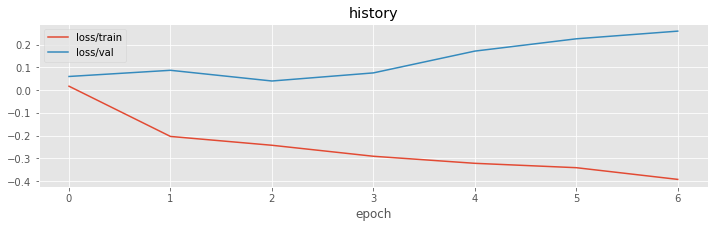

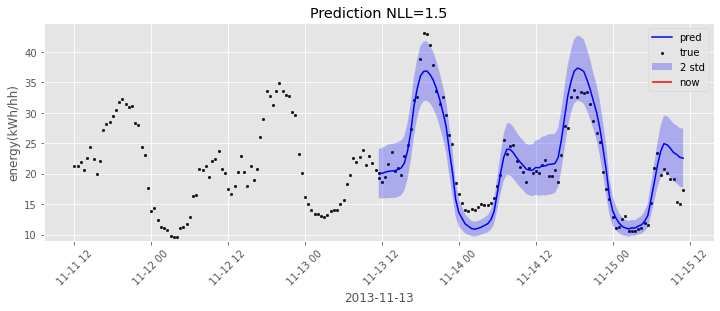

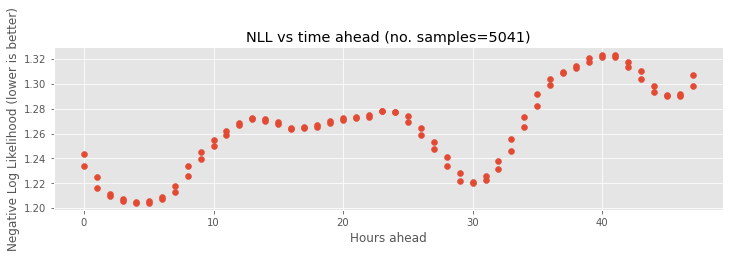

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name   | Type | Params
--------------------------------
0 | _model | RANP | 108 K 


RANP


Epoch     7: reducing learning rate of group 0 to 3.0000e-05.



RANP
mean_NLL -0.04
       loss/train  model_loss/train          step  loss/val
epoch                                                      
0.0      0.098570          0.099123    998.871795  0.055426
1.0     -0.136263         -0.135751   2923.750000  0.008383
2.0     -0.184636         -0.184242   4873.625000 -0.035571
3.0     -0.203627         -0.203329   6823.500000 -0.064338
4.0     -0.231923         -0.231709   8773.375000 -0.052904
5.0     -0.250552         -0.250389  10723.250000 -0.062541
6.0     -0.274888         -0.274789  12673.125000 -0.015443
7.0     -0.279982         -0.279893  14623.000000 -0.041318


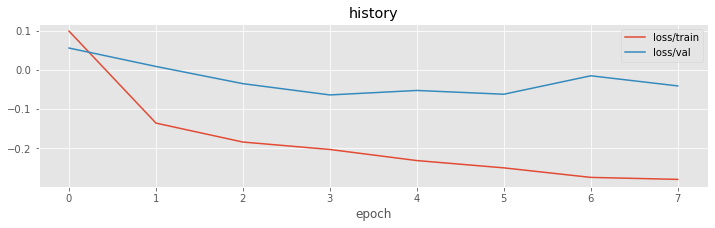

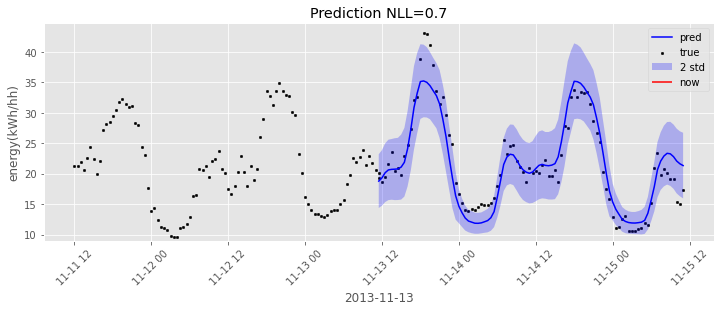

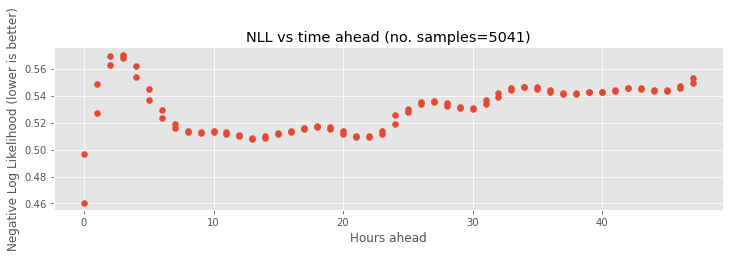

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name   | Type | Params
--------------------------------
0 | _model | LSTM | 136 K 


LSTM


Epoch     4: reducing learning rate of group 0 to 3.0000e-05.



LSTM
mean_NLL 0.41
       loss/train         step  loss/val
epoch                                   
0.0      0.107718   998.871795  0.260356
1.0     -0.144750  2923.750000  0.365532
2.0     -0.203951  4873.625000  0.343091
3.0     -0.245870  6823.500000  0.305063
4.0     -0.271529  8773.375000  0.409992


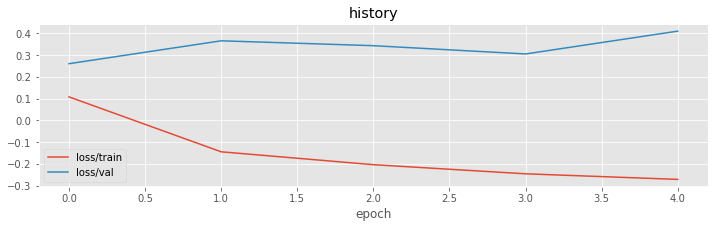

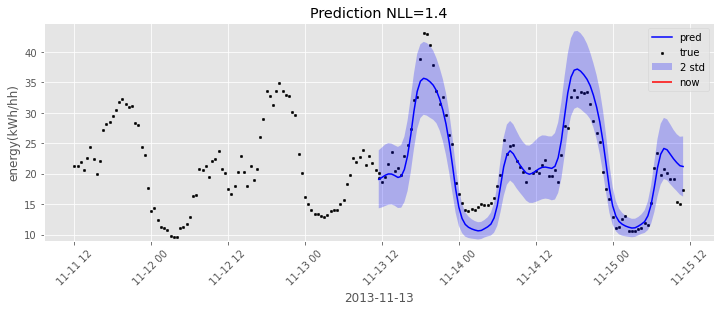

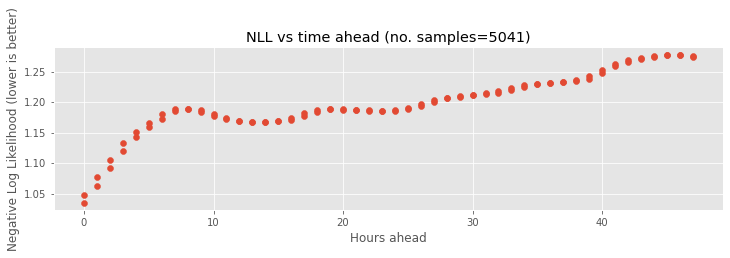

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name   | Type        | Params
---------------------------------------
0 | _model | LSTMSeq2Seq | 109 K 


LSTMSeq2Seq


Epoch     5: reducing learning rate of group 0 to 3.0000e-05.



LSTMSeq2Seq
mean_NLL 0.08
       loss/train          step  loss/val
epoch                                    
0.0      0.124480    998.871795  0.068806
1.0     -0.161390   2923.750000  0.060152
2.0     -0.206281   4873.625000  0.061572
3.0     -0.224555   6823.500000  0.076988
4.0     -0.248640   8773.375000  0.081371
5.0     -0.259238  10723.250000  0.076422


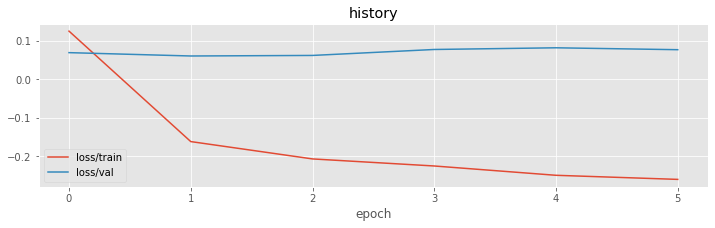

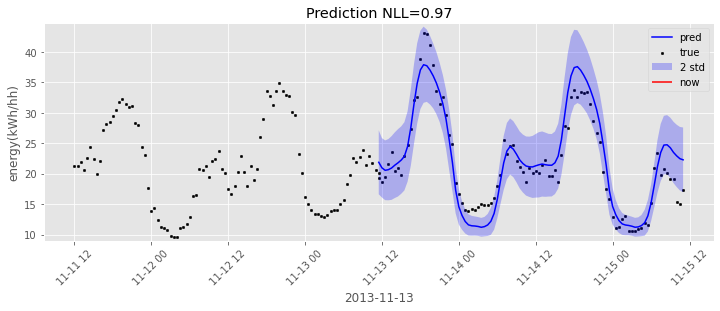

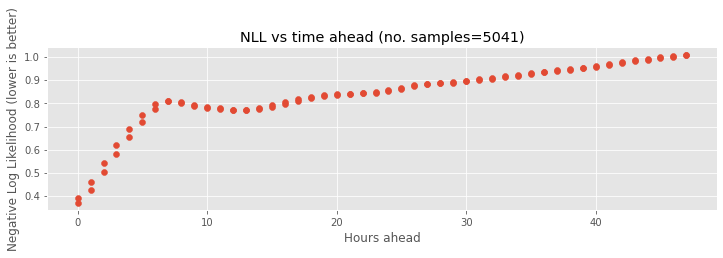

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name   | Type               | Params
----------------------------------------------
0 | _model | TransformerSeq2Seq | 2 M   


TransformerSeq2Seq


/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/pytorch_lightning/utilities/distributed.py:45: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  warnings.warn(*args, **kwargs)


KeyboardInterrupt: 

In [32]:
for m_fn in models:
    pt_model = m_fn()
    name = type(pt_model).__name__
    print(name)

    # Wrap in lightning
    patience = 2
    model = PL_MODEL(pt_model, patience=patience, lr=2e-5, weight_decay=1e-3).to(device)

    # Trainer    
    trainer = pl.Trainer(gpus=1,
                         min_epochs=2,
                         max_epochs=30,
                         amp_level='O1',
                         precision=16,
                         gradient_clip_val=1,
                         logger=CSVLogger("logs",
                                          name=type(pt_model).__name__),
                         callbacks=[
                             EarlyStopping(monitor='loss/val', patience=patience*2),
#                              PrintTableMetricsCallback2()
                         ],
    )

    # Train
    trainer.fit(model, dl_train, dl_test)



    ds_predss = predict_multi(model.to(device),
                       ds_test.datasets,
                       batch_size*2,
                       device=device,
                       scaler=output_scaler)
    
    print(name)
    print(f'mean_NLL {ds_predss.nll.mean().item():2.2f}')
    
    # Performance
    ds_preds = ds_predss.isel(block=0)
    print(plot_hist(trainer))
    plot_performance(ds_preds)
    
    model.cpu()
    free_mem()

# Plots

In [31]:
# Get latest checkpoint for a model type...
pt_model = models[1]()
name = type(pt_model).__name__

checkpoints = (Path('logs')/name).glob('version_*')
sort_checkpoints = lambda f:int(f.stem.split('_')[-1])
checkpoints = sorted(checkpoints, key=sort_checkpoints)
latest_checkpoint = checkpoints[-1]
checkpoint_f = sorted(latest_checkpoint.glob('checkpoints/*.ckpt'))[-1]
print('pt model name', name)
print('latest_checkpoint', checkpoint_f)

pt model name RANP
latest_checkpoint logs/RANP/version_26/checkpoints/epoch=7.ckpt


/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [32]:
# Load
model = PL_MODEL(pt_model).to(device)
model.load_from_checkpoint(str(checkpoint_f), model=pt_model)

PL_MODEL(
  (_model): RANP(
    (_lstm): LSTM(18, 32, num_layers=2, batch_first=True)
    (_latent_encoder): LatentEncoder(
      (_encoder): BatchMLP(
        (initial): NPBlockRelu2d(
          (linear): Linear(in_features=33, out_features=32, bias=False)
          (act): ReLU()
          (dropout): Dropout2d(p=0, inplace=False)
        )
        (encoder): Sequential()
        (final): Linear(in_features=32, out_features=32, bias=True)
      )
      (_self_attention): Attention(
        (_W): MultiheadAttention(
          (out_proj): _LinearWithBias(in_features=32, out_features=32, bias=True)
        )
      )
      (_penultimate_layer): Linear(in_features=32, out_features=32, bias=True)
      (_mean): Linear(in_features=32, out_features=64, bias=True)
      (_log_var): Linear(in_features=32, out_features=64, bias=True)
    )
    (_deterministic_encoder): DeterministicEncoder(
      (_d_encoder): BatchMLP(
        (initial): NPBlockRelu2d(
          (linear): Linear(in_features=33, 

In [33]:
ds_predss = predict_multi(model.to(device),
                   ds_test.datasets,
                   batch_size*4,
                   device=device,
                   scaler=output_scaler)
ds_predss.nll.mean().item()

0.023227039724588394

In [34]:
ds_pred_block = ds_predss.isel(block=1)

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# holoviews pred

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
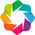

In [45]:
import holoviews as hv
from holoviews import opts

import holoviews as hv
from holoviews import opts

import datashader as ds
from holoviews.operation.datashader import datashade, shade, dynspread, rasterize
from holoviews.operation import decimate

hv.extension('bokeh')

In [41]:
# A few diagnostic plots
d_source = ds_predss.mean(['t_ahead',
                           'block'])['nll'].groupby('t_source').mean()
nll_vs_time = (hv.Curve(d_source).opts(width=600,
                                       height=200,
                                       title='Error vs time of prediction'))

d_ahead = ds_predss.mean(['t_source',
                          'block'])['nll'].groupby('t_ahead_hours').mean()
nll_vs_tahead = (hv.Curve(
    (d_ahead.t_ahead_hours,
     d_ahead)).redim(x='hours ahead',
                     y='nll').opts(width=600,
                                   height=200,
                                   title='Error vs time ahead'))

true_vs_pred = datashade(hv.Scatter(
    (ds_predss.y_true,
     ds_predss.y_pred))).redim(x='true', y='pred').opts(title='Scatter plot')
true_vs_pred = dynspread(true_vs_pred)

l = nll_vs_time + nll_vs_tahead + true_vs_pred
l.cols(1).opts(
    framewise=True,
    shared_axes=False,
)

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/bokeh/core/property/bases.py:241: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  return new == old


:Layout
   .Curve.I      :Curve   [t_source]   (nll)
   .Curve.II     :Curve   [hours ahead]   (nll)
   .DynamicMap.I :DynamicMap   []
      :RGB   [true,pred]   (R,G,B,A)

In [42]:
def hv_predict_from_time(t_source):
    """Plot predictions with holoviews"""

    # Let us pass in an int
    if isinstance(t_source, int):
        t_source = ds_pred_block.t_source[t_source].to_pandas()

    d = ds_pred_block.sel(t_source=t_source)

    # Sometimes there are duplicate times, take the first
    if len(d.t_source.shape) and d.t_source.shape[0] > 0:
        d = d.isel(t_source=0)
    if len(d.t_source.shape) and d.t_source.shape[0] == 0:
        return None

    now = d.t_source.to_pandas()

    # Plot true
    x = np.concatenate([d.t_past, d.t_target])
    yt = np.concatenate([d.y_past, d.y_true])
    p = hv.Scatter({
        'x': x,
        'y': yt
    }, label='true').opts(color='black')

    # Get arrays
    xf = d.t_target.values
    yp = d.y_pred
    s = d.y_pred_std
    p *= hv.Curve({
        'x': xf,
        'y': yp
    }, label='pred').opts(color='blue')
    p *= hv.Area((xf, yp - 2 * s, yp + 2 * s),
                 vdims=['y', 'y2'],
                 label='2*std').opts(alpha=0.5, line_width=0)

    # plot now line
    p *= hv.VLine(now, label='now').opts(color='red', framewise=True)
    return p.opts(title=f'Prediction at {now}. NLL={d.nll.mean().item():2.2f}')


dmap_hv_predict_from_time = (hv.DynamicMap(hv_predict_from_time, kdims=['t_source'])
        .redim.values(t_source=ds_pred_block.t_source.to_pandas())
        .opts(width=800,
                     height=300, 
                    ))
dmap_hv_predict_from_time

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/bokeh/core/property/bases.py:241: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  return new == old


:DynamicMap   [t_source]
   :Overlay
      .Scatter.True       :Scatter   [x]   (y)
      .Curve.Pred         :Curve   [x]   (y)
      .Area.A_2_times_std :Area   [x]   (y,y2)
      .VLine.Now          :VLine   [x,y]

In [132]:
def hv_plot_predictions_vs_time(it_ahead=6,
                                std=False,
                                ds_pred_block=ds_pred_block):
    """Plot predictions vs time with holoviews"""

    d = ds_pred_block.isel(t_ahead=it_ahead).groupby('t_source').first()

    p = hv.Scatter({
        'x': d.t_source,
        'y': d.y_true
    }, label='true').opts(color='black', size=2)

    # Get arrays
    xf = d.t_source.values
    yp = d.y_pred
    s = d.y_pred_std

    # Mean    
    p *= hv.Curve({'x': xf, 'y': yp}, label='pred').opts(color='blue')
    if std:
        p *= hv.Spread((xf, yp, s*2),
                     label='2*std').opts(alpha=0.5, line_width=0)
    else:
        p = datashade(p)

    title = f'Prediction at {it_ahead * pd.Timedelta(freq)} ahead. NLL={d.nll.mean().item():2.2f}'
    return p.opts(
                  title=title,
                  width=800,
                  height=300,
                  tools=['xwheel_zoom'],
                  active_tools=['xwheel_zoom', 'pan'],
                 )


p = hv_plot_predictions_vs_time(
    6, std=True, ds_pred_block=ds_pred_block.isel(t_source=slice(100, 4000)))
p

/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/home/wassname/anaconda/envs/seq2seq-time/lib/python3.7/site-packages/bokeh/core/property/bases.py:241: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  return new == old


:Overlay
   .Scatter.True         :Scatter   [x]   (y)
   .Curve.Pred           :Curve   [x]   (y)
   .Spread.A_2_times_std :Spread   [x]   (y,yerror)

# Summarize experiments

# LR finder

In [ ]:

# # Run learning rate finder
# lr_finder = trainer.tuner.lr_find(model)

# # Results can be found in
# lr_finder.results

# # Plot with
# fig = lr_finder.plot(suggest=True)
# fig.show()

# # Pick point based on plot, or get suggestion
# new_lr = lr_finder.suggestion()